# Project: Women in Data Science (WiDS) Datathon 2021

The WiDS Datathon 2021 focuses on patient health, with an emphasis on the chronic condition of diabetes, through data from MIT’s GOSSIS (Global Open Source Severity of Illness Score) initiative. Brought to you by the WiDS Worldwide team at Stanford, the West Big Data Innovation Hub, and the WiDS Datathon Committee, this year’s datathon is open until March 1, 2021. Winners will be announced at the WiDS Conference via livestream, reaching a community of 100,000+ data enthusiasts across more than 85 countries.

# Project Description

Getting a rapid understanding of the context of a patient’s overall health has been particularly important during the COVID-19 pandemic as healthcare workers around the world struggle with hospitals overloaded by patients in critical condition. Intensive Care Units (ICUs) often lack verified medical histories for incoming patients. A patient in distress or a patient who is brought in confused or unresponsive may not be able to provide information about chronic conditions such as heart disease, injuries, or diabetes. Medical records may take days to transfer, especially for a patient from another medical provider or system. Knowledge about chronic conditions such as diabetes can inform clinical decisions about patient care and ultimately improve patient outcomes.

This year's challenge will focus on models to determine whether a patient admitted to an ICU has been diagnosed with a particular type of diabetes, Diabetes Mellitus. Using data from the first 24 hours of intensive care, individuals and teams will explore labeled training data for model development. Participants will then upload predictions for unlabeled data to Kaggle and these predictions will be used to determine the public leaderboard rankings, as well as the final leaderboard revealed at the close of the competition.

# Import Libraries

In [ ]:
!pip install pywaffle

     |████████████████████████████████| 532kB 8.9MB/s 


In [ ]:
!pip install pycomp

     |████████████████████████████████| 61kB 5.9MB/s 
     |████████████████████████████████| 225kB 11.3MB/s 
     |████████████████████████████████| 12.4MB 249kB/s 
     |████████████████████████████████| 20.1MB 1.3MB/s 
     |████████████████████████████████| 6.8MB 42.4MB/s 
     |████████████████████████████████| 327kB 52.1MB/s 
     |████████████████████████████████| 296kB 53.5MB/s 
  Created wheel for shap: filename=shap-0.37.0-cp36-cp36m-linux_x86_64.whl size=463910 sha256=2fd7f734e39253451f89e9d47bced4006ae751c37987a54fe664677cafa9386c
  Stored in directory: /root/.cache/pip/wheels/df/ad/b0/aa7815ec68850d66551ef618095eccb962c8f6022f1d3dd989
Successfully built shap
ERROR: tensorflow 2.4.1 has requirement numpy~=1.19.2, but you'll have numpy 1.18.5 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is

In [ ]:
!pip install catboost

     |████████████████████████████████| 65.8MB 69kB/s 


In [ ]:
!pip install bayesian-optimization

  Created wheel for bayesian-optimization: filename=bayesian_optimization-1.2.0-cp36-none-any.whl size=11685 sha256=7fba0355cd29e45b7e270ca46cce57a571ba7c942b7e9d493533c2e4179be3cd
  Stored in directory: /root/.cache/pip/wheels/5a/56/ae/e0e3c1fc1954dc3ec712e2df547235ed072b448094d8f94aec
Successfully built bayesian-optimization


In [ ]:
!pip install seaborn==0.11

     |████████████████████████████████| 286kB 8.3MB/s 
ERROR: pycomp 0.2.25 has requirement seaborn==0.10.0, but you'll have seaborn 0.11.0 which is incompatible.
  Found existing installation: seaborn 0.10.0
    Uninstalling seaborn-0.10.0:
      Successfully uninstalled seaborn-0.10.0


In [ ]:
import pandas as pd
import numpy as np
import networkx as nx
import missingno as msno
import scipy
from scipy import stats, special
from scipy.stats import kurtosis, iqr, skew, gmean, hmean, mode, normaltest, shapiro, ks_2samp
import warnings
warnings.filterwarnings(action="ignore")


# visualisation
import matplotlib.pyplot as plt
import seaborn as sns
from pywaffle import Waffle
from pycomp.viz.insights import *
import plotly.express as px
%matplotlib inline
plt.rcParams["figure.dpi"] = 100

# model building
from tqdm import tqdm
from sklearn.model_selection import train_test_split, KFold, StratifiedKFold, cross_val_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder, OrdinalEncoder
from sklearn.feature_selection import SelectPercentile
from sklearn.ensemble import GradientBoostingClassifier
from catboost import Pool, cv, CatBoostClassifier, CatBoostRegressor
from sklearn.preprocessing import LabelEncoder
from lightgbm import LGBMClassifier
import lightgbm as lgb
from xgboost.sklearn import XGBClassifier
from sklearn import metrics
from sklearn.metrics import (confusion_matrix, precision_recall_curve, auc,roc_curve, recall_score, roc_auc_score,
                             classification_report, f1_score, precision_recall_fscore_support)
from bayes_opt import BayesianOptimization as BO


In [ ]:
sns.__version__

'0.11.0'

# Set up

In [ ]:
# set options
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

In [ ]:
def custom_pallete(custom_colors):
    customPalette = sns.set_palette(sns.color_palette(custom_colors))
    sns.palplot(sns.color_palette(custom_colors),size=0.8)
    plt.tick_params(axis='both', labelsize=0, length = 0)

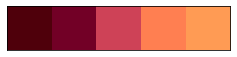

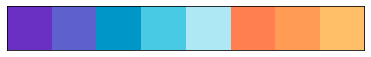

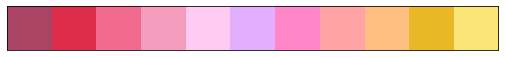

In [ ]:
red = ["#4f000b","#720026","#ce4257","#ff7f51","#ff9b54"]
bo = ["#6930c3","#5e60ce","#0096c7","#48cae4","#ade8f4","#ff7f51","#ff9b54","#ffbf69"]
pink = ["#aa4465","#dd2d4a","#f26a8d","#f49cbb","#ffcbf2","#e2afff","#ff86c8","#ffa3a5","#ffbf81","#e9b827","#f9e576"]
custom_pallete(red)
custom_pallete(bo)
custom_pallete(pink)

# Import Data

In [ ]:
data_train = pd.read_csv("TrainingWiDS2021.csv", index_col=0)
data_test = pd.read_csv("UnlabeledWiDS2021.csv", index_col=0)
submission_template = pd.read_csv("SolutionTemplateWiDS2021.csv")

In [ ]:
y = pd.DataFrame(data_train["diabetes_mellitus"])

In [ ]:
temp_data_train = data_train.copy()
temp_data_test = data_test.copy()
temp_data_train['category'] = 'Train'
temp_data_test['category'] = 'Test'
temp_data_train = temp_data_train.drop('diabetes_mellitus',axis=1)

In [ ]:
data_full = pd.concat([temp_data_train, temp_data_test], axis=0)

# Exploratory Data Analysis

In [ ]:
data_train.shape

(130157, 180)

## Missing Values

In [ ]:
def get_datatypes(data):
  dt_int = []
  dt_float = []
  dt_object = []
  for col in data_train.columns:
      x = data_train[col].dtype
      if (x=="int64"):
          dt_int.append(col)
      elif (x=="float64"):
          dt_float.append(col)
      else:
          dt_object.append(col)
  return dt_int, dt_float, dt_object

In [ ]:
def check_missing(df, col):
    missing  = 0
    misVariables = []
    CheckNull = df.isnull().sum()
    for var in range(0, len(CheckNull)):
        misVariables.append([col[var], CheckNull[var], round(CheckNull[var]/len(df),3)])
        missing = missing + 1

    if missing == 0:
        print('Dataset is complete with no blanks.')
    else:
        df_misVariables = pd.DataFrame.from_records(misVariables)
        df_misVariables.columns = ['Variable', 'Missing', 'Percentage']
        s = df_misVariables.sort_values(by=['Percentage'], ascending=False).style.bar(subset=['Percentage'], color='#d65f5f')
        display(s)
    return df_misVariables

In [ ]:
dt_int, dt_float, dt_object = get_datatypes(data_train)

In [ ]:
ranked_df_missing_value = check_missing(data_train, data_train.columns)

,Variable,Missing,Percentage
128,h1_bilirubin_max,119861,0.921000
129,h1_bilirubin_min,119861,0.921000
126,h1_albumin_max,119005,0.914000
127,h1_albumin_min,119005,0.914000
146,h1_lactate_max,118467,0.910000
147,h1_lactate_min,118467,0.910000
170,h1_pao2fio2ratio_max,113397,0.871000
171,h1_pao2fio2ratio_min,113397,0.871000
167,h1_arterial_ph_min,107849,0.829000
166,h1_arterial_ph_max,107849,0.829000


Based on hierachical clustering of missing values. The dendrogram allows us to more fully correlate variable completion, revaling trends deeper than the pairwise ones visible in the correlation heatmap

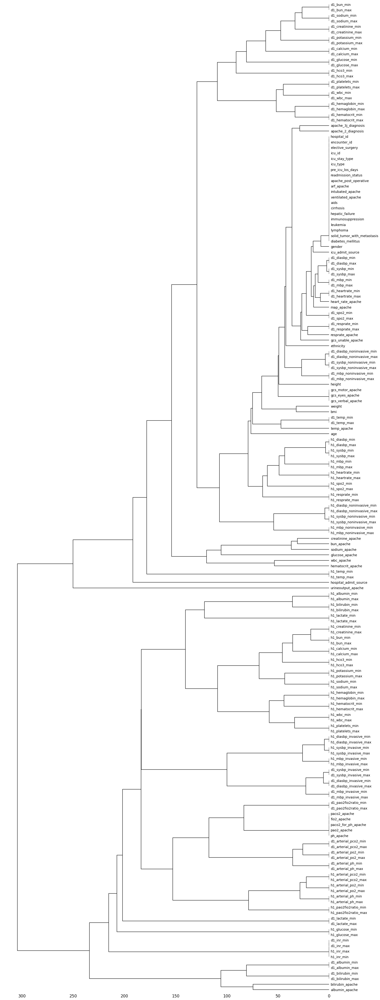

In [ ]:
msno.dendrogram(data_train, fontsize=14)

## Correlation

In [ ]:
seed = 101
def correlation_network(data, corr_interval=[-0.9, 0.9], data_type="Train", node_color=pink[2]):
    #data = data.to_pandas()
    corr = data.corr()
    corr = pd.melt(corr.reset_index(), id_vars="index")
    corr.columns = ['x', 'y', 'value']
    
    # filter only high correlations
    high_corr = corr[((corr['value'] <= corr_interval[0]) | (corr['value'] >= corr_interval[1]))]
    high_corr = high_corr[(high_corr["value"] != 1)].reset_index(drop=True)
    
    ########## GRAPH ############
    sources = list(high_corr.x.unique())
    targets = list(high_corr.y.unique())
    
    plt.figure(figsize=(16, 12))
    # graph object (create nodes and edges)
    g = nx.from_pandas_edgelist(high_corr, source='x', target='y')
    
    # layout
    layout = nx.spring_layout(g, iterations=50, k=0.6, seed=seed)
    # list of sizes based on g.degree
    target_size = [g.degree(t)*80 for t in targets]
    
    nx.draw_networkx_nodes(g, layout, nodelist=sources, node_color=node_color, node_size=800, alpha=0.5)
    nx.draw_networkx_edges(g, layout, width=1, edge_color=bo[2])
    
    target_dict = dict(zip(targets, targets))
    nx.draw_networkx_labels(g, layout, labels=target_dict)
    
    plt.axis('off')
    plt.title(f"{data_type}: Highest Correlations Network", fontsize=25)
    plt.show();

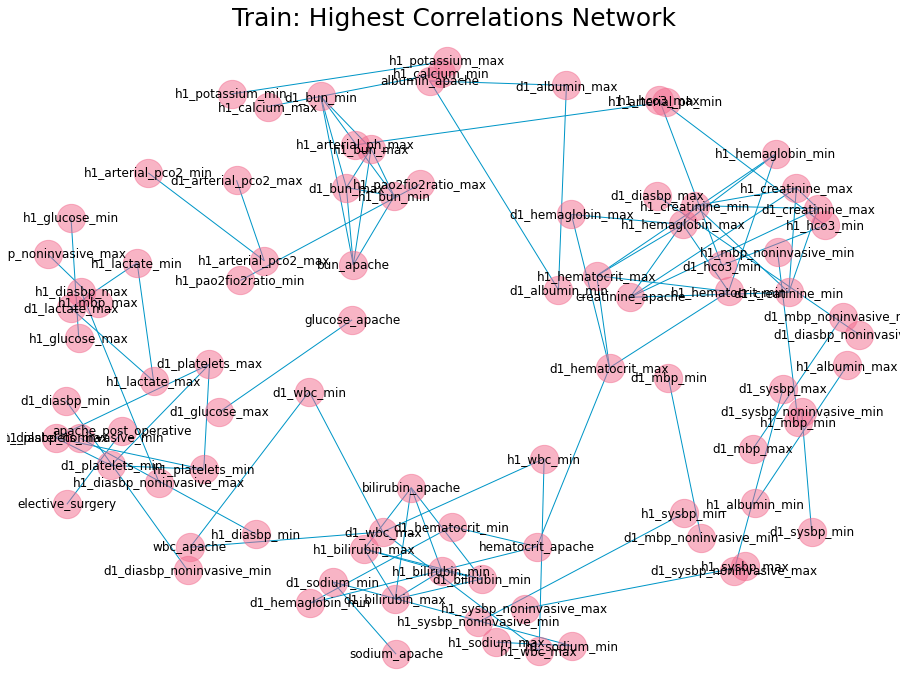

In [ ]:
# get features which are highly correlated (|0.9|)
correlation_network(data=data_train, corr_interval=[-0.9, 0.9], data_type="Train", node_color=pink[2])

In [ ]:
# show correlated values
dt_float_target = dt_float
dt_float_target.append("diabetes_mellitus")
float_target_corr = data_train[np.intersect1d(data_train.columns, dt_float_target)].corr().style.background_gradient(cmap="Oranges")
float_target_corr

In [ ]:
def get_corr(data,threshold):
    corr_col=set()
    corr_mat=data.corr()
    for i in range(len(corr_mat.columns)):
        for j in range(i):
            if abs(corr_mat.iloc[i,j])>threshold:
                colname=corr_mat.columns[i]
                corr_col.add(colname)
    return corr_col

In [ ]:
high_corr = get_corr(data_train, 0.9)
high_corr

{'apache_post_operative',
 'd1_albumin_max',
 'd1_albumin_min',
 'd1_bilirubin_max',
 'd1_bilirubin_min',
 'd1_bun_max',
 'd1_bun_min',
 'd1_creatinine_max',
 'd1_creatinine_min',
 'd1_diasbp_noninvasive_max',
 'd1_diasbp_noninvasive_min',
 'd1_glucose_max',
 'd1_hemaglobin_min',
 'd1_hematocrit_max',
 'd1_hematocrit_min',
 'd1_mbp_noninvasive_max',
 'd1_mbp_noninvasive_min',
 'd1_platelets_min',
 'd1_sodium_min',
 'd1_sysbp_noninvasive_max',
 'd1_sysbp_noninvasive_min',
 'd1_wbc_max',
 'd1_wbc_min',
 'h1_albumin_min',
 'h1_arterial_pco2_max',
 'h1_arterial_pco2_min',
 'h1_arterial_ph_min',
 'h1_bilirubin_max',
 'h1_bilirubin_min',
 'h1_bun_max',
 'h1_bun_min',
 'h1_calcium_min',
 'h1_creatinine_max',
 'h1_creatinine_min',
 'h1_diasbp_noninvasive_max',
 'h1_diasbp_noninvasive_min',
 'h1_glucose_min',
 'h1_hco3_max',
 'h1_hco3_min',
 'h1_hemaglobin_max',
 'h1_hemaglobin_min',
 'h1_hematocrit_max',
 'h1_hematocrit_min',
 'h1_inr_max',
 'h1_inr_min',
 'h1_lactate_max',
 'h1_lactate_min',


## Target Variable

In [ ]:
data_train.shape

(130157, 180)

In [ ]:
d_map = {1: 'Diabetic', 0: 'Not Diabetic'}

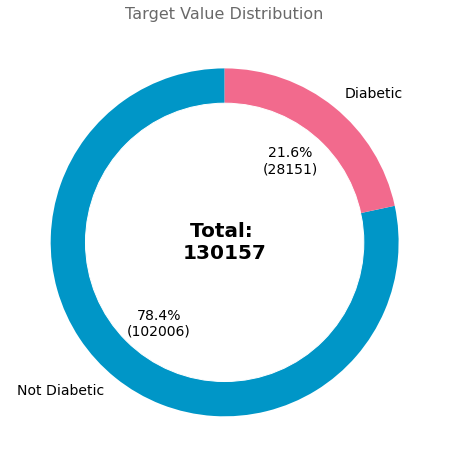

In [ ]:
plot_donut_chart(df=data_train, col="diabetes_mellitus", label_names=d_map, colors=[bo[2], pink[2]], title="Target Value Distribution")

There is an imbalnce of data. We will need to either upsample/SMOTE it or assign weights to the our model

## Categorical Columns

### Ethnicity Distribution

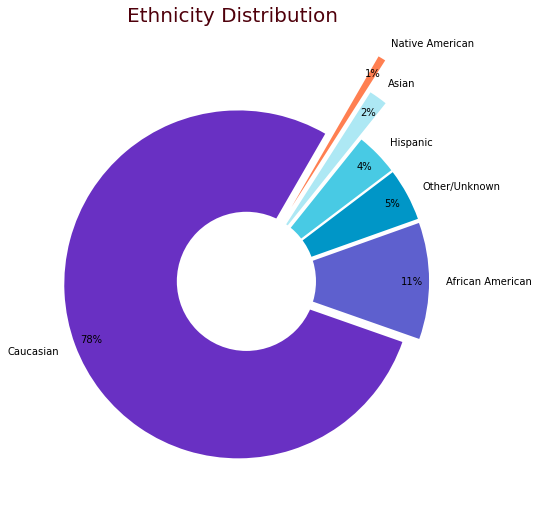

In [ ]:
fig, ax = plt.subplots(figsize=(16, 8))
fig.suptitle("Ethnicity Distribution", size=20, color=red[0])
explode = (0.05, 0.05, 0.05, 0.05, 0.3, 0.5)
labels = ["Caucasian","African American","Other/Unknown","Hispanic","Asian","Native American"]
sizes = data_train["ethnicity"].value_counts()
ax.pie(sizes, explode=explode, colors=bo, startangle=60, labels=labels,autopct='%1.0f%%', pctdistance=0.9)
ax.add_artist(plt.Circle((0,0),0.4,fc='white'))
plt.show()

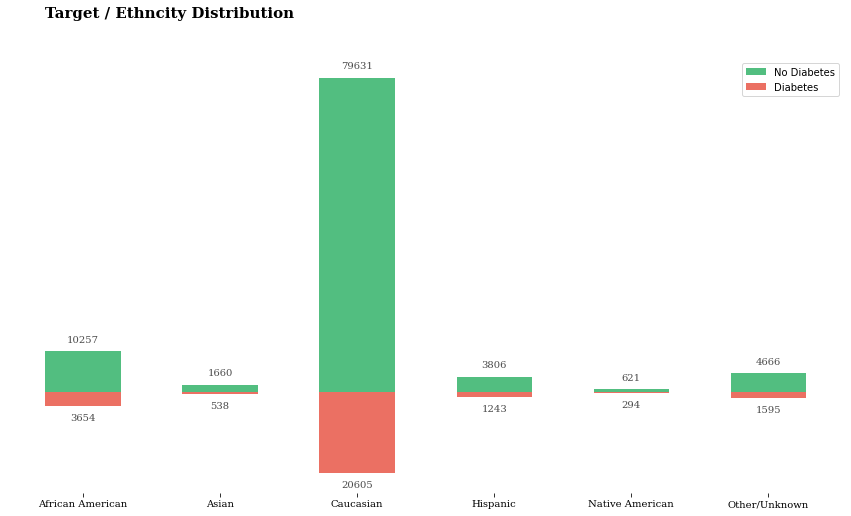

In [ ]:
ehtnicity_target = data_train.groupby(["diabetes_mellitus"])["ethnicity"].value_counts().unstack().sort_index()

no = ehtnicity_target.loc[0]
yes = -ehtnicity_target.loc[1]

fig, ax = plt.subplots(1,1, figsize=(15, 8))

# creating the bars
ax.bar(no.index, no, width=0.55, color="#27AE60", alpha=0.8, label="No Diabetes")
ax.bar(yes.index, yes, width=0.55, color="#E74C3C", alpha=0.8, label="Diabetes")
#ax.set_ylim(-50000, 100)

# annotating the values for man category
for i in no.index:
    ax.annotate(f"{no[i]}",
                xy = (i, no[i] + 3000),
                va = "center",
                ha = "center",
                fontweight = "light",
                fontfamily = "serif",
                color = "#4a4a4a")
    
# annotating the values for woman category
for i in yes.index:
    ax.annotate(f"{-yes[i]}",
                xy = (i, yes[i] - 3000),
                va = "center",
                ha = "center",
                fontweight = "light",
                fontfamily = "serif",
                color = "#4a4a4a")

# clear griflines
for s in ["top", "left", "right", "bottom"]:
    ax.spines[s].set_visible(False)
    
ax.set_xticklabels(ehtnicity_target.columns, fontfamily = "serif")
ax.set_yticks([])
ax.legend()
fig.text(0.16, 0.95, "Target / Ethncity Distribution", fontsize = 15, fontweight = "bold", fontfamily = "serif")
plt.show()

### Gender Distribution

https://fontawesome.com/icons?d=gallery&q=male&m=free

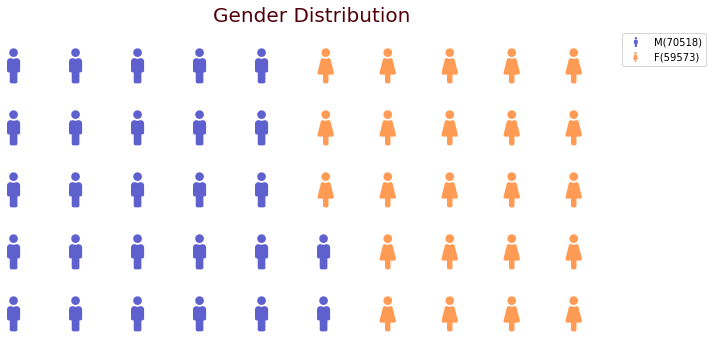

In [ ]:
gender = data_train["gender"].value_counts()
fig = plt.figure(
    FigureClass=Waffle, 
    rows=5,
    columns=10,
    values=gender,
    colors = (bo[1], bo[6]),
    title={'label': 'Gender Distribution', 'loc': 'center','color':red[0],'size':20},
    labels=["{}({})".format(a, b) for a, b in zip(gender.index, gender) ],
    legend={'loc': 'upper left', 'bbox_to_anchor': (1,1)},
    font_size=35, 
    icons = ['male','female'],
    icon_legend=True,
    figsize=(10, 8)
)

Gender distrbution is rather similar

### Hospital Admit Source

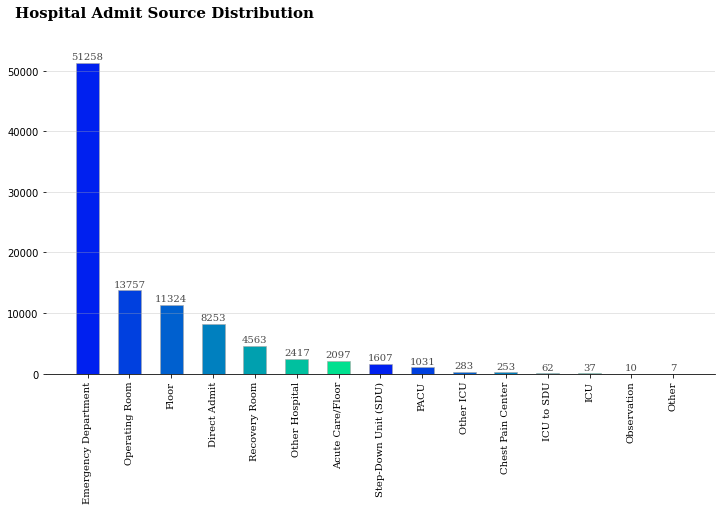

In [ ]:
data_train_hospital = data_train["hospital_admit_source"].value_counts()
fig, ax = plt.subplots(1, 1, figsize=(12, 6))
ax.bar(data_train_hospital.index, data_train_hospital, width=0.55,
       edgecolor="darkgray", 
       color=sns.color_palette("winter", 7),
       linewidth=0.6)
for i in data_train_hospital.index:
    ax.annotate(f"{data_train_hospital[i]}",
                xy=(i, data_train_hospital[i] +1000),
                va='center', ha='center', fontweight='light', fontfamily='serif', color='#4a4a4a')
    
for s in ['top', 'left', 'right']:
    ax.spines[s].set_visible(False)

ax.set_xticklabels(data_train_hospital.index, fontfamily='serif', rotation=90)

fig.text(0.09, 0.95, 'Hospital Admit Source Distribution', fontsize=15, fontweight='bold', fontfamily='serif')    
ax.grid(axis='y', linestyle='-', alpha=0.4)    
plt.show()

We could perhaps group some of these categories into one

### ICU Admit Source

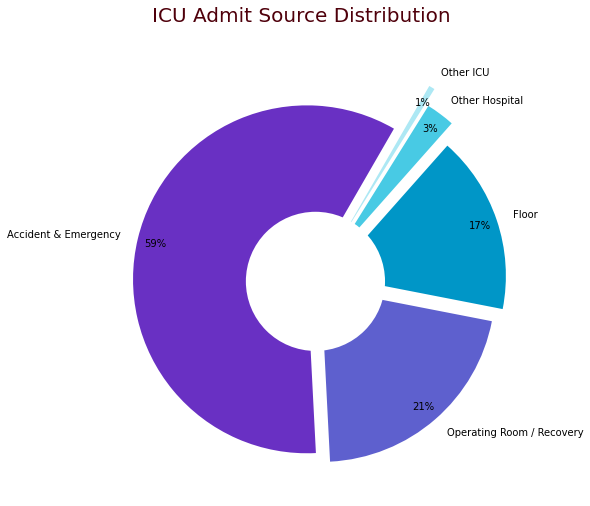

In [ ]:
fig, ax = plt.subplots(figsize=(16, 8))
fig.suptitle("ICU Admit Source Distribution", size=20, color=red[0])
explode = (0.05, 0.05, 0.1, 0.2, 0.3)
labels = ["Accident & Emergency", "Operating Room / Recovery", "Floor", "Other Hospital", "Other ICU"]
sizes = data_train["icu_admit_source"].value_counts()
ax.pie(sizes, explode=explode, colors=bo, startangle=60, labels=labels,autopct='%1.0f%%', pctdistance=0.9)
ax.add_artist(plt.Circle((0,0),0.4,fc='white'))
plt.show()

### ICU Stay Type

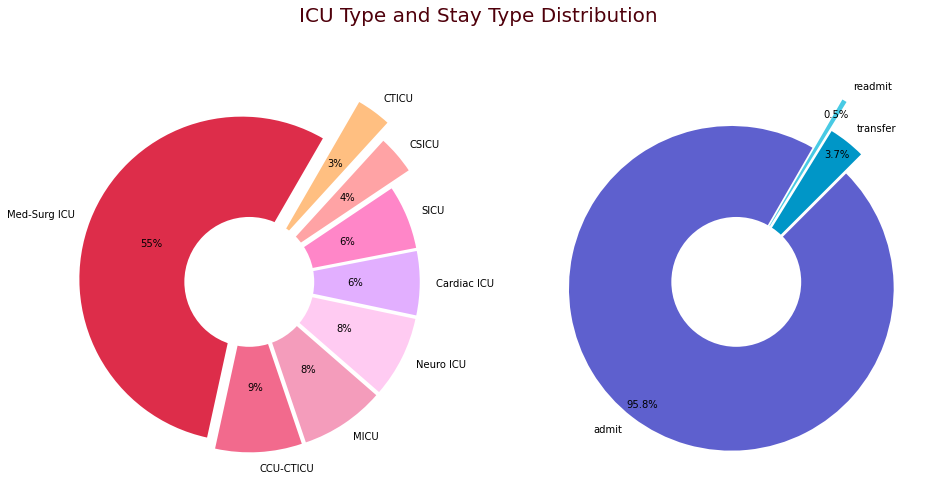

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
fig.suptitle("ICU Type and Stay Type Distribution", size=20, color=red[0])
axs = [ax1, ax2]

explode = (0.05, 0.05,0.05, 0.05,0.05, 0.05,0.2, 0.3)
labels = ['Med-Surg ICU', 'CCU-CTICU', 'MICU','Neuro ICU', 'Cardiac ICU', 'SICU','CSICU','CTICU']
sizes = data_train['icu_type'].value_counts()
ax1.pie(sizes, explode=explode, colors=pink[1:], startangle=60, labels=labels,autopct='%1.0f%%', pctdistance=0.6)
ax1.add_artist(plt.Circle((0,0),0.4,fc='white'))

explode = (0.05, 0.1, 0.3)
labels = ['admit','transfer', 'readmit']
sizes = data_train['icu_stay_type'].value_counts()
ax2.pie(sizes, explode=explode, colors=bo[1:], startangle=60, labels=labels,autopct='%1.1f%%', pctdistance=0.9)
ax2.add_artist(plt.Circle((0,0),0.4,fc='white'))

plt.show()

## Numerical Columns

### Age

There is an outlier at age=0.

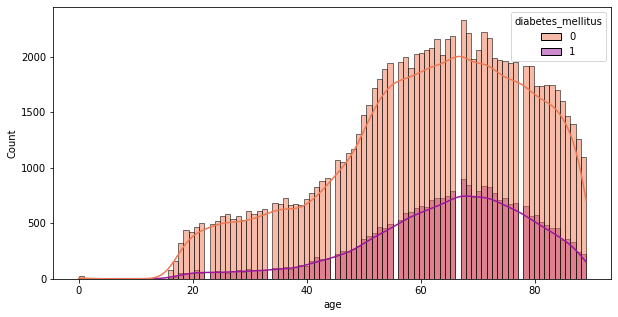

In [ ]:
fig, ax = plt.subplots(figsize=(10,5))
sns.histplot(data_train, x='age', hue='diabetes_mellitus', kde=True, palette="plasma_r")

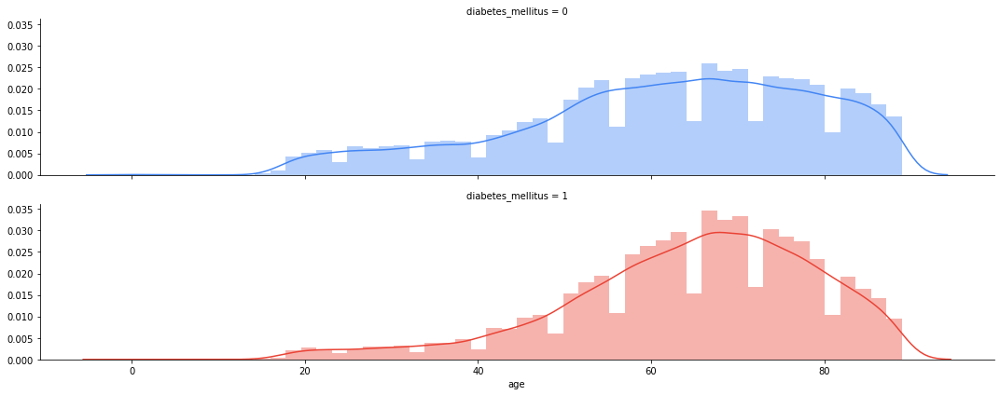

In [ ]:
g = sns.FacetGrid(data_train, #the dataframe to pull from
                  row="diabetes_mellitus",
                  hue = "diabetes_mellitus",#define the column for each subplot row to be differentiated by, #define the column for each subplot color to be differentiated by
                  aspect=5, #aspect * height = width
                  height=3, #height of each subplot
                  palette=['#4285F4','#EA4335'] #google colors
                 )
g.map(sns.distplot, "age")

Age distribution of those with diabetes and without are quite similar.

### BMI

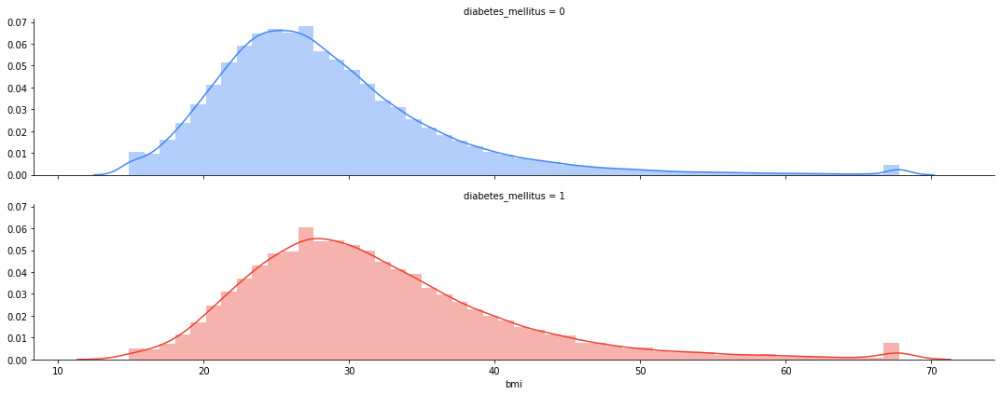

In [ ]:
g = sns.FacetGrid(data_train, #the dataframe to pull from
                  row="diabetes_mellitus",
                  hue = "diabetes_mellitus",#define the column for each subplot row to be differentiated by, #define the column for each subplot color to be differentiated by
                  aspect=5, #aspect * height = width
                  height=3, #height of each subplot
                  palette=['#4285F4','#EA4335'] #google colors
                 )
g.map(sns.distplot, "bmi")

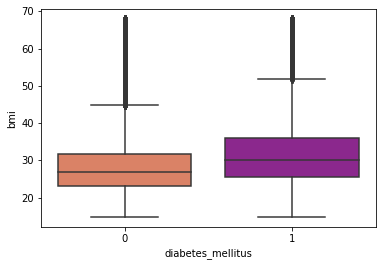

In [ ]:
sns.boxplot(x="diabetes_mellitus", y="bmi", data=data_train, palette="plasma_r")

BMI of both patients with diabetes vs without are also similar

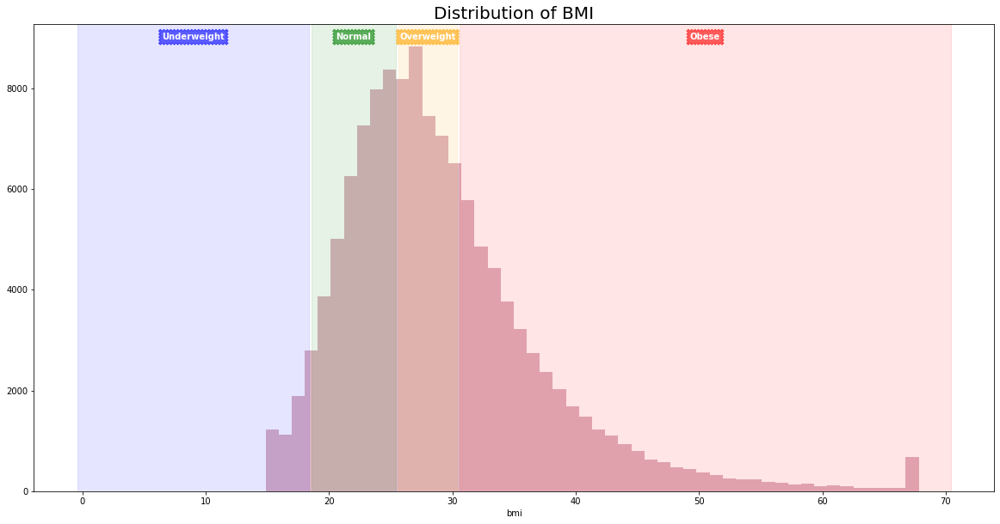

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(20, 10))
ax = sns.distplot(data_train["bmi"], kde=False)
values = np.array([rec.get_height() for rec in ax.patches])
#norm = plt.Normalize(values.min(), values.max())
#colors = plt.cm.jet(norm(values))
#for rec, col in zip(ax.patches, colors):
#    rec.set_color(col)
span_color =  ['blue','green','orange','red']
span_range = [[0,18], [19,25], [26,30], [31,70]]

for idx, span_title in enumerate(['Underweight', 'Normal', 'Overweight', 'Obese']):
    ax.annotate(span_title,
                    xy=(sum(span_range[idx])/2 ,1000),
                    xytext=(0,470), textcoords='offset points',
                    va="center", ha="center",
                    color="w", fontsize=10, fontweight='bold',
                    bbox=dict(boxstyle='sawtooth', pad=0.4, color=span_color[idx], alpha=0.6))
    ax.axvspan(span_range[idx][0]-0.4,span_range[idx][1]+0.4,  color=span_color[idx], alpha=0.1)
plt.title("Distribution of BMI", size = 20)
plt.show()

## Integer Columns

Text(0.5, 1.05, 'Elective surgery and Diabetes Mellitus')

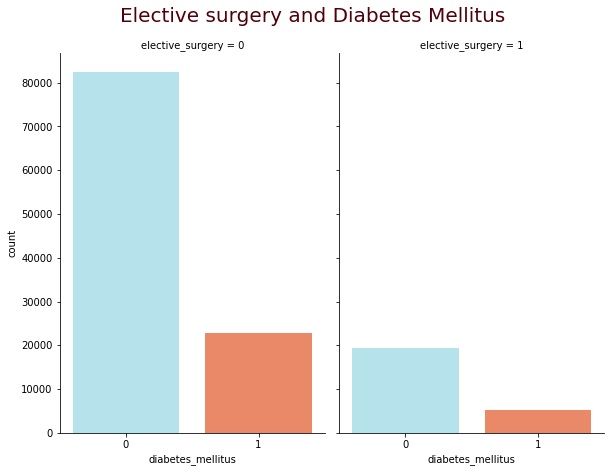

In [ ]:
plot = sns.catplot("diabetes_mellitus", col="elective_surgery", data=data_train, kind="count",
                   height=6,
                   aspect=0.7,
                   palette=bo[4:])
plot.fig.suptitle("Elective surgery and Diabetes Mellitus", size=20, color=red[0], y=1.05)

In [ ]:
elective_surgery_yes = data_train[data_train["elective_surgery"] == 1]
elective_surgery_no = data_train[data_train["elective_surgery"] == 0]

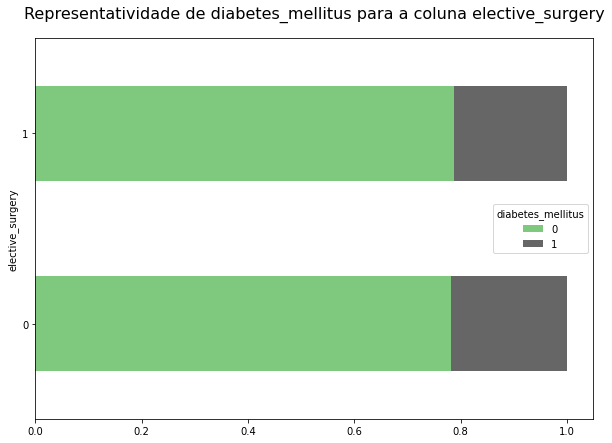

In [ ]:
plot_pct_countplot(df=data_train, col="elective_surgery", hue="diabetes_mellitus", palette="Accent")

Patients who have undergone elective surgery are just as likely to be diabetic 

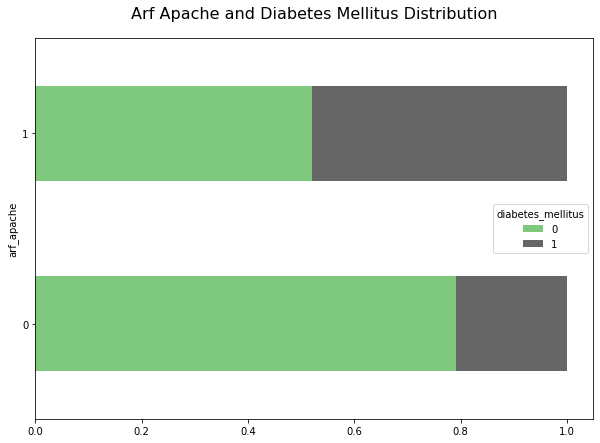

In [ ]:
plot_pct_countplot(df=data_train, col="arf_apache", hue="diabetes_mellitus", palette="Accent",
                  title="Arf Apache and Diabetes Mellitus Distribution")

Patients with arf_apache are more likely to be diabetic

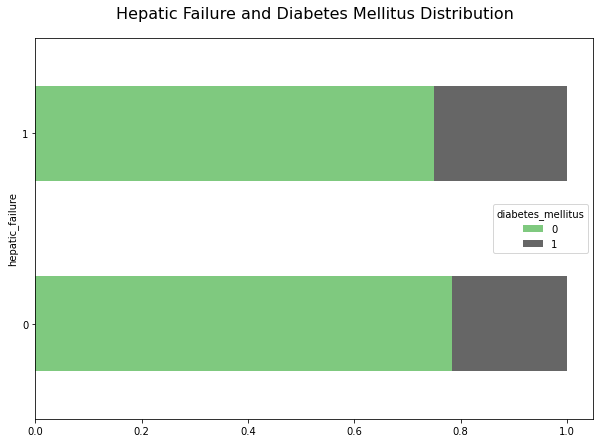

In [ ]:
plot_pct_countplot(df=data_train, col="hepatic_failure", hue="diabetes_mellitus", palette="Accent",
                  title="Hepatic Failure and Diabetes Mellitus Distribution")

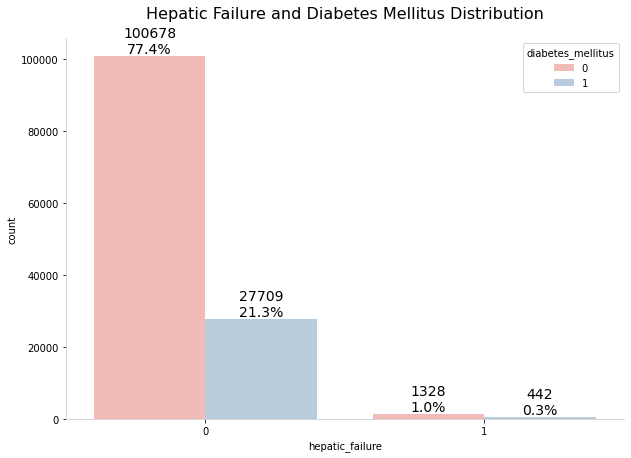

In [ ]:
plot_countplot(df=data_train, col="hepatic_failure", hue="diabetes_mellitus", palette="Pastel1",
               title="Hepatic Failure and Diabetes Mellitus Distribution")

# Feature Engineering

In [ ]:
data_full.head()

,encounter_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,readmission_status,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_invasive_max,d1_mbp_invasive_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_invasive_max,d1_sysbp_invasive_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_invasive_max,h1_mbp_invasive_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_invasive_max,h1_sysbp_invasive_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_inr_max,d1_inr_min,d1_lactate_max,d1_lactate_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_albumin_max,h1_albumin_min,h1_bilirubin_max,h1_bilirubin_min,h1_bun_max,h1_bun_min,h1_calcium_max,h1_calcium_min,h1_creatinine_max,h1_creatinine_min,h1_glucose_max,h1_glucose_min,h1_hco3_max,h1_hco3_min,h1_hemaglobin_max,h1_hemaglobin_min,h1_hematocrit_max,h1_hematocrit_min,h1_inr_max,h1_inr_min,h1_lactate_max,h1_lactate_min,h1_platelets_max,h1_platelets_min,h1_potassium_max,h1_potassium_min,h1_sodium_max,h1_sodium_min,h1_wbc_max,h1_wbc_min,d1_arterial_pco2_max,d1_arterial_pco2_min,d1_arterial_ph_max,d1_arterial_ph_min,d1_arterial_po2_max,d1_arterial_po2_min,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,h1_arterial_pco2_min,h1_arterial_ph_max,h1_arterial_ph_min,h1_arterial_po2_max,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,category
1,214826,118,68.0,22.732803,0,Caucasian,M,180.3,Floor,Floor,92,admit,CTICU,0.541667,0,73.9,2.3,113.0,502.01,0,0,0.4,31.0,2.51,NaN,3.0,6.0,0.0,4.0,168.0,118.0,27.4,0,40.0,NaN,NaN,NaN,NaN,36.0,134.0,39.3,NaN,0,14.1,46.0,32.0,68.0,37.0,68.0,37.0,119.0,72.0,66.0,40.0,89.0,46.0,89.0,46.0,34.0,10.0,100.0,74.0,122.0,64.0,131.0,73.0,131.0,73.0,39.9,37.2,NaN,NaN,68.0,63.0,68.0,63.0,119.0,108.0,NaN,NaN,86.0,85.0,86.0,85.0,26.0,18.0,100.0,74.0,NaN,NaN,131.0,115.0,131.0,115.0,39.5,37.5,2.3,2.3,0.4,0.4,31.0,30.0,8.5,7.4,2.51,2.23,168.0,109.0,19.0,15.0,8.9,8.9,27.4,27.4,NaN,NaN,1.3,1.0,233.0,233.0,4.0,3.4,136.0,134.0,14.1,14.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,Train
2,246060,81,77.0,27.421875,0,Caucasian,F,160.0,Floor,Floor,90,admit,Med-Surg ICU,0.927778,0,70.2,NaN,108.0,203.01,0,0,NaN,9.0,0.56,1.0,1.0,3.0,0.0,1.0,145.0,120.0,36.9,0,46.0,37.0,37.0,51.0,7.45,33.0,145.0,35.1,NaN,1,12.7,NaN,NaN,95.0,31.0,95.0,31.0,118.0,72.0,NaN,NaN,120.0,38.0,120.0,38.0

In [ ]:
def create_features(x):
    #g_e = x["ethnicity"] + '_' + x["gender"]
    a_bmi = x["age"]*x["bmi"]
    a_glu = x["age"]*x["d1_glucose_max"]
    bmi_glu = x["bmi"]*x["d1_glucose_max"]
    return a_bmi, a_glu, bmi_glu

In [ ]:
def get_bmi_cat(x):
    if x<= 18.5:
        return "Underweight"
    elif (x>18.5 and x<=25):
        return "Normal"
    elif (x>25 and x<=30):
        return "Overweight"
    elif (x>30 and x<=35):
        return "Obese_Class1"
    elif (x>35 and x<=40):
        return "Obese_Class2"
    elif x>40:
        return "Obese_Class3"
    else:
        return "Error"

In [ ]:
data_full["cat_bmi"] = data_full["bmi"].apply(get_bmi_cat)
a_bmi, a_glu, bmi_glu = create_features(data_full)

In [ ]:
min_col= [col for col in data_full.columns if 'd1' in col and col.endswith('_min')]
# corrects max min value so that max > min
if 1 :
    min_col= [col for col in data_full.columns if 'd1' in col and col.endswith('_min')]
    for col in min_col :
        d1_col = col.replace('_min','_max')
        data_full[d1_col] = np.where(data_full[col] > data_full[d1_col], np.nan ,  data_full[d1_col])
        
    min_col= [col for col in data_full.columns if 'h1' in col and col.endswith('_min')]
    for col in min_col :
        d1_col = col.replace('_min','_max')
        data_full[d1_col ] = np.where(data_full[col] > data_full[d1_col], np.nan ,  data_full[d1_col])

In [ ]:
lab_metrics = [c.replace("_max", "") for c in data_full.columns.tolist() if 'max' in c]

In [ ]:
def get_lab_metrics(_X, lab_metrics):
    _X_lab_metrics = pd.DataFrame()
    for l in lab_metrics:
        try:
            _X_lab_metrics[l + '_max_minus_min'] = _X[l + '_max'] - _X[l + '_min']
        except:
            pass
    
    return _X_lab_metrics

In [ ]:
df_lab_metrics = get_lab_metrics(data_full, lab_metrics)

In [ ]:
data_full_lab_metrics = pd.concat([data_full, df_lab_metrics], axis=1)

In [ ]:
data_full_lab_metrics["age_bmi"] = a_bmi
data_full_lab_metrics["age_glucose"] = a_glu
data_full_lab_metrics["bmi_glucose"] = bmi_glu

In [ ]:
data_full_lab_metrics.loc[data_full_lab_metrics.age == 0, 'age'] = np.nan
data_full_lab_metrics = data_full_lab_metrics.drop(['readmission_status','encounter_id','hospital_id'], axis=1)
data_full_lab_metrics = data_full_lab_metrics.replace([np.inf, -np.inf], np.nan)

In [ ]:
data_full_lab_metrics["hospital_admit_source"] = data_full_lab_metrics["hospital_admit_source"].replace({"Other ICU":"ICU",
                                                                                 "ICU to SDU": "SDU",
                                                                                 "Step-Down Unit (SDU)": "SDU",
                                                                                 "Acute Care/Floor": "Floor",
                                                                                 "Other Hospital": "Other"})

In [ ]:
dt_object.append('elective_surgery')
dt_object.append('icu_id')
dt_object.append('apache_post_operative')
dt_object.append('arf_apache')
dt_object.append('intubated_apache')
dt_object.append('ventilated_apache')
dt_object.append('aids')
dt_object.append('cirrhosis')
dt_object.append('hepatic_failure')
dt_object.append('immunosuppression')
dt_object.append('leukemia')
dt_object.append('lymphoma')
dt_object.append('solid_tumor_with_metastasis')

In [ ]:
data_full_lab_metrics['comorbidity_score'] = data_full_lab_metrics['aids'].values * 23 + data_full_lab_metrics['cirrhosis'] * 4  + data_full_lab_metrics['hepatic_failure'] * 16 + data_full_lab_metrics['immunosuppression'] * 10 + data_full_lab_metrics['leukemia'] * 10 + data_full_lab_metrics['lymphoma'] * 13 + data_full_lab_metrics['solid_tumor_with_metastasis'] * 11
data_full_lab_metrics['comorbidity_score'] = data_full_lab_metrics['comorbidity_score'].fillna(0)
data_full_lab_metrics['gcs_sum'] = data_full_lab_metrics['gcs_eyes_apache']+data_full_lab_metrics['gcs_motor_apache']+data_full_lab_metrics['gcs_verbal_apache']
data_full_lab_metrics['gcs_sum'] = data_full_lab_metrics['gcs_sum'].fillna(0)
data_full_lab_metrics['apache_2_diagnosis_type'] = data_full_lab_metrics.apache_2_diagnosis.round(-1).fillna(-100).astype('int32')
data_full_lab_metrics['apache_3j_diagnosis_type'] = data_full_lab_metrics.apache_3j_diagnosis.round(-2).fillna(-100).astype('int32')
data_full_lab_metrics['bmi_type'] = data_full_lab_metrics.bmi.fillna(0).apply(lambda x: 5 * (round(int(x)/5)))
data_full_lab_metrics['height_type'] = data_full_lab_metrics.height.fillna(0).apply(lambda x: 5 * (round(int(x)/5)))
data_full_lab_metrics['weight_type'] = data_full_lab_metrics.weight.fillna(0).apply(lambda x: 5 * (round(int(x)/5)))
data_full_lab_metrics['age_type'] = data_full_lab_metrics.age.fillna(0).apply(lambda x: 10 * (round(int(x)/10)))
data_full_lab_metrics['gcs_sum_type'] = data_full_lab_metrics.gcs_sum.fillna(0).apply(lambda x: 2.5 * (round(int(x)/2.5))).divide(2.5)
data_full_lab_metrics['apache_3j_diagnosis_x'] = data_full_lab_metrics['apache_3j_diagnosis'].astype('str').str.split('.',n=1,expand=True)[0]
data_full_lab_metrics['apache_2_diagnosis_x'] = data_full_lab_metrics['apache_2_diagnosis'].astype('str').str.split('.',n=1,expand=True)[0]
data_full_lab_metrics['apache_3j_diagnosis_split1'] = np.where(data_full_lab_metrics['apache_3j_diagnosis'].isna() , np.nan , data_full_lab_metrics['apache_3j_diagnosis'].astype('str').str.split('.',n=1,expand=True)[1]  )
data_full_lab_metrics['apache_2_diagnosis_split1'] = np.where(data_full_lab_metrics['apache_2_diagnosis'].isna() , np.nan , data_full_lab_metrics['apache_2_diagnosis'].apply(lambda x : x % 10)  )


In [ ]:
# categorise apache_3j_diagnoses category
data_full_lab_metrics['apache_3j'] = np.where(data_full_lab_metrics['apache_3j_diagnosis_type']<0 , np.nan ,
                                      np.where(data_full_lab_metrics['apache_3j_diagnosis_type'] < 200, 'Cardiovascular' , 
                                      np.where(data_full_lab_metrics['apache_3j_diagnosis_type'] < 400, 'Respiratory' , 
                                      np.where(data_full_lab_metrics['apache_3j_diagnosis_type'] < 500, 'Neurological' , 
                                      np.where(data_full_lab_metrics['apache_3j_diagnosis_type'] < 600, 'Sepsis' , 
                                      np.where(data_full_lab_metrics['apache_3j_diagnosis_type'] < 800, 'Trauma' ,  
                                      np.where(data_full_lab_metrics['apache_3j_diagnosis_type'] < 900, 'Haematological' ,         
                                      np.where(data_full_lab_metrics['apache_3j_diagnosis_type'] < 1000, 'Renal/Genitourinary' ,         
                                      np.where(data_full_lab_metrics['apache_3j_diagnosis_type'] < 1200, 'Musculoskeletal/Skin disease' , 'Operative Sub-Diagnosis Codes')))))))))

In [ ]:
# aggregating
agg = data_full_lab_metrics["icu_id"].value_counts().to_dict()
data_full_lab_metrics['icu_id_counts'] = np.log1p(data_full_lab_metrics['icu_id'].map(agg))

agg = data_full_lab_metrics["age"].value_counts().to_dict()
data_full_lab_metrics['age_counts'] = np.log1p(data_full_lab_metrics['age'].map(agg))

data_full_lab_metrics["diff_bmi"] = data_full_lab_metrics['bmi'].copy() 
data_full_lab_metrics['bmi'] = data_full_lab_metrics['weight']/((data_full_lab_metrics['height']/100)**2)
data_full_lab_metrics["diff_bmi"] = data_full_lab_metrics["diff_bmi"]-data_full_lab_metrics['bmi']

data_full_lab_metrics['pre_icu_los_days'] = data_full_lab_metrics['pre_icu_los_days'].apply(lambda x:special.expit(x) )

data_full_lab_metrics['abmi'] = data_full_lab_metrics['age']/data_full_lab_metrics['bmi']
data_full_lab_metrics['age'] = data_full_lab_metrics['weight']/data_full_lab_metrics['age']


In [ ]:
d_cols = [c for c in data_full_lab_metrics.columns if(c.startswith("d1"))]
h_cols = [c for c in data_full_lab_metrics.columns if(c.startswith("h1"))]

data_full_lab_metrics["dailyLabs_row_nan_count"] = data_full_lab_metrics[d_cols].isna().sum(axis=1)
data_full_lab_metrics["hourlyLabs_row_nan_count"] = data_full_lab_metrics[h_cols].isna().sum(axis=1)
data_full_lab_metrics["diff_labTestsRun_daily_hourly"] = data_full_lab_metrics["dailyLabs_row_nan_count"] - data_full_lab_metrics["hourlyLabs_row_nan_count"]

In [ ]:
more_extreme_cols = [c for c in data_full_lab_metrics.columns if(c.endswith("_day_more_extreme"))]
data_full_lab_metrics["total_day_more_extreme"] = data_full_lab_metrics[more_extreme_cols].sum(axis=1)

data_full_lab_metrics["d1_resprate_div_mbp_min"] = data_full_lab_metrics["d1_resprate_min"].div(data_full_lab_metrics["d1_mbp_min"])
data_full_lab_metrics["d1_resprate_div_sysbp_min"] = data_full_lab_metrics["d1_resprate_min"].div(data_full_lab_metrics["d1_sysbp_min"])
data_full_lab_metrics["d1_lactate_min_div_diasbp_min"] = data_full_lab_metrics["d1_lactate_min"].div(data_full_lab_metrics["d1_diasbp_min"])
data_full_lab_metrics["d1_heartrate_min_div_d1_sysbp_min"] = data_full_lab_metrics["d1_heartrate_min"].div(data_full_lab_metrics["d1_sysbp_min"])
data_full_lab_metrics["d1_hco3_div"]= data_full["d1_hco3_max"].div(data_full_lab_metrics["d1_hco3_min"])
data_full_lab_metrics["d1_resprate_times_resprate"] = data_full_lab_metrics["d1_resprate_min"].multiply(data_full_lab_metrics["d1_resprate_max"])
data_full_lab_metrics["left_average_spo2"] = (2*data_full_lab_metrics["d1_spo2_max"] + data_full_lab_metrics["d1_spo2_min"])/3

data_full_lab_metrics["total_chronic"] = data_full_lab_metrics[["aids","cirrhosis", 'hepatic_failure']].sum(axis=1)
data_full_lab_metrics["total_cancer_immuno"] = data_full_lab_metrics[[ 'immunosuppression', 'leukemia', 'lymphoma', 'solid_tumor_with_metastasis']].sum(axis=1)


data_full_lab_metrics["has_complicator"] = data_full_lab_metrics[["aids","cirrhosis", 'hepatic_failure',
                            'immunosuppression', 'leukemia', 'lymphoma', 'solid_tumor_with_metastasis']].max(axis=1)

data_full_lab_metrics[["has_complicator","total_chronic","total_cancer_immuno","has_complicator"]].describe()

,has_complicator,total_chronic,total_cancer_immuno,has_complicator
count,140391.000000,140391.000000,140391.000000,140391.000000
mean,0.068245,0.030152,0.057497,0.068245
std,0.252167,0.212364,0.274285,0.252167
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000
max,1.000000,3.000000,4.000000,1.000000


In [ ]:
high_corr = get_corr(data_full_lab_metrics, 0.9)
high_corr

{'apache_2_diagnosis_type',
 'apache_3j_diagnosis_type',
 'apache_post_operative',
 'bmi_type',
 'd1_albumin_max',
 'd1_albumin_min',
 'd1_bilirubin_max',
 'd1_bilirubin_min',
 'd1_bun_max',
 'd1_bun_min',
 'd1_creatinine_max',
 'd1_creatinine_min',
 'd1_diasbp_noninvasive_max',
 'd1_diasbp_noninvasive_max_minus_min',
 'd1_diasbp_noninvasive_min',
 'd1_glucose_max',
 'd1_hco3_div',
 'd1_hemaglobin_min',
 'd1_hematocrit_max',
 'd1_hematocrit_min',
 'd1_mbp_invasive_max_minus_min',
 'd1_mbp_noninvasive_max',
 'd1_mbp_noninvasive_max_minus_min',
 'd1_mbp_noninvasive_min',
 'd1_platelets_min',
 'd1_sodium_min',
 'd1_spo2_max_minus_min',
 'd1_sysbp_noninvasive_max',
 'd1_sysbp_noninvasive_max_minus_min',
 'd1_sysbp_noninvasive_min',
 'd1_wbc_max',
 'd1_wbc_min',
 'gcs_sum',
 'gcs_sum_type',
 'h1_albumin_max',
 'h1_albumin_min',
 'h1_arterial_pco2_max',
 'h1_arterial_pco2_min',
 'h1_arterial_ph_min',
 'h1_bilirubin_max',
 'h1_bilirubin_min',
 'h1_bun_max',
 'h1_bun_min',
 'h1_calcium_min',
 

In [ ]:
# drop highly correlated 

In [ ]:
# convert categorical columns
lbls = {}
for col in data_full_lab_metrics.select_dtypes(exclude = np.number).columns.tolist():
    le = LabelEncoder().fit(pd.concat([data_full_lab_metrics[col].astype(str),data_full_lab_metrics[col].astype(str)]))   
    data_full_lab_metrics[col] = le.transform(data_full_lab_metrics[col].astype(str))
    lbls[col] = le
print('Categorical columns:', list(lbls.keys()))

Categorical columns: ['ethnicity', 'gender', 'hospital_admit_source', 'icu_admit_source', 'icu_stay_type', 'icu_type', 'category', 'cat_bmi', 'apache_3j_diagnosis_x', 'apache_2_diagnosis_x', 'apache_3j_diagnosis_split1', 'apache_3j']


In [ ]:
data_full_lab_metrics.shape

(140391, 277)

In [ ]:
# fill missing values
# datatypes
dt_int = []
dt_float = []
dt_object = []
for col in data_full_lab_metrics.columns:
    x = data_full_lab_metrics[col].dtype
    if (x=="int64"):
        dt_int.append(col)
    elif (x=="float64"):
        dt_float.append(col)
    else:
        dt_object.append(col)

In [ ]:
dt_object

['apache_2_diagnosis_type', 'apache_3j_diagnosis_type']

In [ ]:
categorical = dt_int + dt_object

In [ ]:
categorical_to_remove = ['apache_2_diagnosis_type','apache_3j_diagnosis_type', "apache_3j_diagnosis_split1"]

In [ ]:
float_variables = data_full_lab_metrics.columns[~data_full_lab_metrics.columns.isin(categorical)].tolist()

In [ ]:
for word in categorical:
  if word in categorical_to_remove:
    categorical.remove(word)

In [ ]:
for col in float_variables:
    data_full_lab_metrics[col] = data_full_lab_metrics[col].fillna(-1)
for col in categorical:
    data_full_lab_metrics[col] = data_full_lab_metrics[col].fillna(0)

# Train Test Split

In [ ]:
main_train = data_full_lab_metrics[data_full_lab_metrics["category"] == 1]
main_test = data_full_lab_metrics[data_full_lab_metrics["category"] == 0]

In [ ]:
main_train = main_train.reset_index().drop("index", axis=1)
y = y.reset_index().drop("index", axis=1)

In [ ]:
main_train_temp = main_train.copy()
main_test_temp = main_test.copy()

# Model Building

## CATBOOST

In [ ]:
catboost_train = main_train.copy()
catboost_test = main_test.copy()

In [ ]:
catboost_train["diabetes_mellitus"] = y["diabetes_mellitus"]

In [ ]:
X = catboost_train.drop(["diabetes_mellitus"], axis=1)
y = catboost_train["diabetes_mellitus"]

In [ ]:
train_pool = Pool(data=X, label=y, cat_features=categorical)

In [ ]:
model = CatBoostClassifier(verbose=False, iterations=20000)
model.fit(train_pool, plot=True, silent=True)
print(model.get_best_score())

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

{'learn': {'Logloss': 0.2829178406278961}}


In [ ]:
prediction_catboost = model.predict(catboost_test, prediction_type="Probability")[:,1]

In [ ]:
test_set = pd.read_csv("UnlabeledWiDS2021.csv")

In [ ]:
submission = pd.DataFrame({'encounter_id': test_set['encounter_id'].values,
              'diabetes_mellitus': prediction_catboost})

In [ ]:
submission.to_csv("catboost_33.csv", index=0)

## LGBM

In [ ]:
main_train_temp_temp = main_train_temp.copy()
main_test_temp_temp = main_test_temp.copy()

In [ ]:
lgbm_train = main_train_temp_temp.copy()
lgbm_test = main_test_temp_temp.copy()

In [ ]:
lgbm_train["diabetes_mellitus"] = y

In [ ]:
lgbm_train.head()

,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_invasive_max,d1_mbp_invasive_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_invasive_max,d1_sysbp_invasive_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_invasive_max,h1_mbp_invasive_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_invasive_max,h1_sysbp_invasive_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_inr_max,d1_inr_min,d1_lactate_max,d1_lactate_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_albumin_max,h1_albumin_min,h1_bilirubin_max,h1_bilirubin_min,h1_bun_max,h1_bun_min,h1_calcium_max,h1_calcium_min,h1_creatinine_max,h1_creatinine_min,h1_glucose_max,h1_glucose_min,h1_hco3_max,h1_hco3_min,h1_hemaglobin_max,h1_hemaglobin_min,h1_hematocrit_max,h1_hematocrit_min,h1_inr_max,h1_inr_min,h1_lactate_max,h1_lactate_min,h1_platelets_max,h1_platelets_min,h1_potassium_max,h1_potassium_min,h1_sodium_max,h1_sodium_min,h1_wbc_max,h1_wbc_min,d1_arterial_pco2_max,d1_arterial_pco2_min,d1_arterial_ph_max,d1_arterial_ph_min,d1_arterial_po2_max,d1_arterial_po2_min,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,h1_arterial_pco2_min,h1_arterial_ph_max,h1_arterial_ph_min,h1_arterial_po2_max,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,category,cat_bmi,d1_diasbp_invasive_max_minus_min,d1_diasbp_max_minus_min,d1_diasbp_noninvasive_max_minus_min,d1_heartrate_max_minus_min,d1_mbp_invasive_max_minus_min,d1_mbp_max_minus_min,d1_mbp_noninvasive_max_minus_min,d1_resprate_max_minus_min,d1_spo2_max_minus_min,d1_sysbp_invasive_max_minus_min,d1_sysbp_max_minus_min,d1_sysbp_noninvasive_max_minus_min,d1_temp_max_minus_min,h1_diasbp_invasive_max_minus_min,h1_diasbp_max_minus_min,h1_diasbp_noninvasive_max_minus_min,h1_heartrate_max_minus_min,h1_mbp_invasive_max_minus_min,h1_mbp_max_minus_min,h1_mbp_noninvasive_max_minus_min,h1_resprate_max_minus_min,h1_spo2_max_minus_min,h1_sysbp_invasive_max_minus_min,h1_sysbp_max_minus_min,h1_sysbp_noninvasive_max_minus_min,h1_temp_max_minus_min,d1_albumin_max_minus_min,d1_bilirubin_max_minus_min,d1_bun_max_minus_min,d1_calcium_max_minus_min,d1_creatinine_max_minus_min,d1_glucose_max_minus_min,d1_hco3_max_minus_min,d1_hemaglobin_max_minus_min,d1_hematocrit_max_minus_min,d1_inr_max_minus_min,d1_lactate_max_minus_min,d1_platelets_max_minus_min,d1_potassium_max_minus_min,d1_sodium_max_minus_min,d1_wbc_max_minus_min,h1_albumin_max_minus_min,h1_bilirubin_max_minus_m

In [ ]:
X = lgbm_train.drop(["diabetes_mellitus"],axis=1)
y = lgbm_train["diabetes_mellitus"]

In [ ]:
# These are the class weights for each class
class_0 =(len(y) - len(y[y==0]))/len(y)
class_1 =(len(y) - len(y[y==1]))/len(y)

In [ ]:
print(class_0, class_1)
weight = {0: 0.2, 1:0.8}

0.21628494817796967 0.7837150518220303


In [ ]:
# function to evaluate the score of our model
def eval_auc(pred,real):
    false_positive_rate, recall, thresholds = roc_curve(real, pred)
    roc_auc = auc(false_positive_rate, recall)
    return roc_auc  

## Bayesian Optimisation

In [ ]:
def lgb_bayes(X, y, categoricals_features = None):
    
    """
    To run Bayesian optimization, you need to first specify an evaluation function 
    which should take in a set of parameters and evaluate the performance of that parameter. 
    Here, 'lgb_eval()' is that function and we're using cross-validation 'lgb.cv()' to evaluate
    the model. 
    
    You'll also need to specify the range of the parameter values that you want to search from.
    The dictionary 'lgb_param_space' provides that range.
    """
    
    def lgb_eval(subsample, subsample_freq, learning_rate, feature_fraction,
                max_depth, lambda_l1, lambda_l2, scale_pos_weight):
        
        lgb_params = {'n_estimators':1000,
                    'boosting_type': 'gbdt',
                    'objective': 'binary',
                    'metric': 'auc',
                    'subsample': subsample,
                    'subsample_freq': int(subsample_freq),
                    'learning_rate': learning_rate,
                    'feature_fraction': feature_fraction,
                    'max_depth': int(max_depth),
                    'lambda_l1': lambda_l1,  
                    'lambda_l2': lambda_l2,
                    'early_stopping_rounds': 100,
                    'is_unbalance':True
                    }
        
        dtrain = lgb.Dataset(X, y, categorical_feature = categoricals_features)
        cv_lgb = lgb.cv(lgb_params, dtrain)
        
        return cv_lgb['auc-mean'][-1]
    
    lgb_param_space = {
        'subsample': (0.2, 1),
        'subsample_freq': (1, 10),
        'learning_rate': (0.001, 0.1),
        'feature_fraction': (0.2, 1),
        'lambda_l1': (0, 5),
        'lambda_l2': (0, 5),
        'max_depth': (5, 20),
        'scale_pos_weight': (1, 20)
    }
    
    return lgb_eval, lgb_param_space

In [ ]:
def run_bayes_opt(eval_func, param_space):
    
    """
    This function is to run Bayesian optimization. 
    'init_points' is the number of initializations - random search.
    'n_iter' is the number of iterations after your random initializations.
    """
    
    bo = BO(eval_func, param_space)
    
    n_iter = 15
    init_points = 16
    
    with warnings.catch_warnings():
        warnings.filterwarnings('ignore')
        
        bo.maximize(init_points = init_points,
                   n_iter = n_iter,
                   acq = 'ucb',
                   alpha = 1e-6)
        
    return bo

In [ ]:
if 1:
    # run Bayesian optimization
    lgb_eval, lgb_param_space = lgb_bayes(X, y)
    lgb_bo = run_bayes_opt(lgb_eval, lgb_param_space)
    max_bo_params = lgb_bo.max['params']

|   iter    |  target   | featur... | lambda_l1 | lambda_l2 | learni... | max_depth | scale_... | subsample | subsam... |
-------------------------------------------------------------------------------------------------------------------------
|  1        |  0.8579   |  0.5634   |  4.196    |  2.438    |  0.003842 |  15.21    |  2.771    |  0.999    |  5.92     |
|  2        |  0.8723   |  0.3812   |  0.8616   |  0.9423   |  0.04751  |  12.32    |  18.75    |  0.7002   |  9.974    |
|  3        |  0.8715   |  0.304    |  2.955    |  3.794    |  0.09524  |  12.23    |  4.452    |  0.6859   |  9.462    |
|  4        |  0.8694   |  0.4412   |  4.0      |  1.99     |  0.09996  |  18.13    |  15.16    |  0.5596   |  3.995    |
|  5        |  0.8712   |  0.2178   |  0.4861   |  1.273    |  0.01328  |  15.06    |  12.41    |  0.6476   |  4.594    |
|  6        |  0.8701   |  0.7963   |  3.057    |  1.38     |  0.07839  |  5.297    |  9.758    |  0.5945   |  9.391    |
|  7        |  0.8723   

In [ ]:
opt_params = {'n_estimators':30000,
            'boosting_type': 'gbdt',
            'objective': 'binary',
            'metric': 'auc',
            'class_weight': weight,
            'subsample': max_bo_params['subsample'],
            'subsample_freq': int(max_bo_params['subsample_freq']),
            'learning_rate': max_bo_params['learning_rate'],
            'feature_fraction': max_bo_params['feature_fraction'],
            'max_depth': int(max_bo_params['max_depth']),
            'lambda_l1': max_bo_params['lambda_l1'],  
            'lambda_l2': max_bo_params['lambda_l2']
            }

In [ ]:
err_lgm = []
y_pred_tot_lgm = []
y_folds = []
preds_folds = []

fold = StratifiedKFold(n_splits=5, shuffle=True, random_state=101)
i=1
for train_index, test_index in fold.split(X, y):
    X_train, X_valid = X.iloc[train_index], X.iloc[test_index]
    y_train, y_valid = y.iloc[train_index], y.iloc[test_index]
    
    clf_lgbm = LGBMClassifier(**opt_params)
    
    clf_lgbm.fit(X_train, y_train,
                 eval_set= [(X_train, y_train), (X_valid, y_valid)],
                 categorical_feature = dt_object,
                 early_stopping_rounds=100,
                 verbose=200)
    
    pred_y = clf_lgbm.predict_proba(X_valid)[:,1]
    
    preds_folds.extend(pred_y)
    y_folds.extend(y_valid)
    
    
    loss_score = eval_auc(pred_y, y_valid) 
    print('Our oof AUC score is: ', loss_score)

    pred_test = clf_lgbm.predict_proba(lgbm_test)[:, 1]
    i = i + 1
    
    y_pred_tot_lgm.append(pred_test)

Training until validation scores don't improve for 100 rounds.
[200]	training's auc: 0.871238	valid_1's auc: 0.859002
[400]	training's auc: 0.88886	valid_1's auc: 0.869265
[600]	training's auc: 0.898979	valid_1's auc: 0.872596
[800]	training's auc: 0.906801	valid_1's auc: 0.874041
[1000]	training's auc: 0.913527	valid_1's auc: 0.87479
[1200]	training's auc: 0.919546	valid_1's auc: 0.875091
[1400]	training's auc: 0.924957	valid_1's auc: 0.875311
Early stopping, best iteration is:
[1416]	training's auc: 0.925385	valid_1's auc: 0.875351
Our oof AUC score is:  0.8753508666944335
Training until validation scores don't improve for 100 rounds.
[200]	training's auc: 0.871142	valid_1's auc: 0.857711
[400]	training's auc: 0.88867	valid_1's auc: 0.869356
[600]	training's auc: 0.89894	valid_1's auc: 0.872867
[800]	training's auc: 0.906881	valid_1's auc: 0.874175
[1000]	training's auc: 0.913551	valid_1's auc: 0.87513
[1200]	training's auc: 0.919497	valid_1's auc: 0.875425
[1400]	training's auc: 0.9

In [ ]:
lgbm_prediction_final = np.mean(y_pred_tot_lgm,0)

In [ ]:
def plotImp(model, X , num = 20):
    feature_imp = pd.DataFrame({'Value':model.feature_importances_,'Feature':X.columns})
    plt.figure(figsize=(40, 20))
    sns.set(font_scale = 5)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", 
                                                        ascending=False)[0:num])
    plt.title('LightGBM Features (avg over folds)')
    plt.tight_layout()
    plt.savefig('lgbm_importances-01.png')
    plt.show()

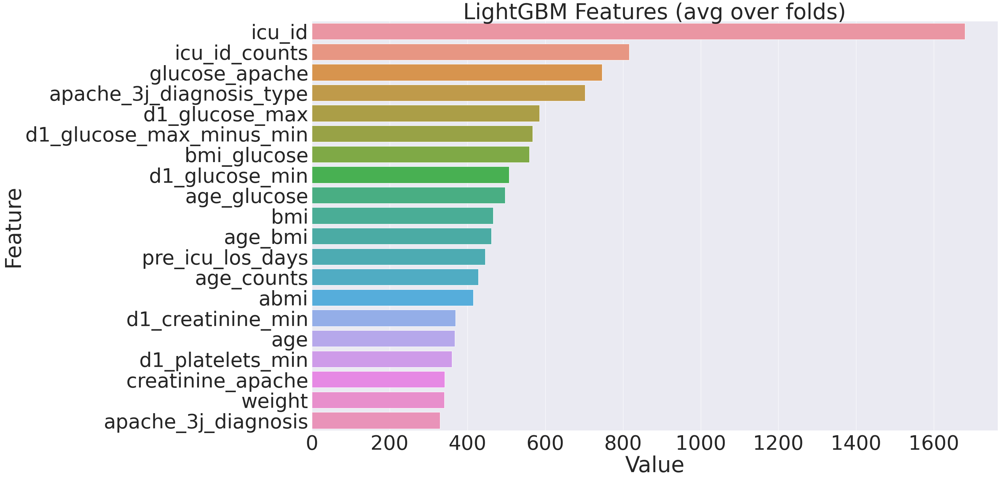

In [ ]:
plotImp(clf_lgbm, X)

In [ ]:
submission = pd.DataFrame({'encounter_id': data_test['encounter_id'].values,
              'diabetes_mellitus': pred_test})

In [ ]:
submission.to_csv("lgbm_new_9.csv", index=0)

## Ensemble

In [ ]:
submission = pd.DataFrame({'encounter_id': data_test['encounter_id'].values,
              'diabetes_mellitus': lgbm_prediction_final*0.3 + prediction_catboost*0.7})

In [ ]:
submission.to_csv("catboost_lgbm_36.csv", index=0)

In [ ]:
output1 = pd.read_csv("submission.csv")

In [ ]:
output1 = output1.rename(columns={"diabetes_mellitus": "NEW"})

In [ ]:
output1["LGBM"] = lgbm_prediction_final
output1["CATBOOST"] = prediction_catboost

In [ ]:
def ensemble(x):
  final = 0.7*x["NEW"] + 0.1*x["LGBM"] + 0.2*x["CATBOOST"]
  return final

In [ ]:
output1["diabetes_mellitus"] = output1.apply(ensemble, axis=1)

In [ ]:
output1.head()

,encounter_id,NEW,LGBM,CATBOOST,diabetes_mellitus
0,144740,0.457592,0.118677,0.051221,0.342426
1,141990,0.720246,0.498402,0.219188,0.597850
2,142038,0.559361,0.260810,0.177505,0.453135
3,138628,0.467315,0.110320,0.043396,0.346831
4,141682,0.755619,0.580403,0.311788,0.649331


In [ ]:
final = output1.loc[:,["encounter_id", "diabetes_mellitus"]]

In [ ]:
final.head()

,encounter_id,diabetes_mellitus
0,144740,0.342426
1,141990,0.597850
2,142038,0.453135
3,138628,0.346831
4,141682,0.649331


In [ ]:
final.to_csv("FINAL4.csv", index=0)